In [1]:
import torch
import sklearn
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import math

from torch import nn
from torch import optim
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Conv2D, MaxPool2D, Dropout,Flatten, Conv1D, MaxPool1D, LSTM, TimeDistributed, RepeatVector
from keras.callbacks import EarlyStopping
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn import metrics
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from sklearn.model_selection import train_test_split

import time
import os
import sys
import pandas as pd
import numpy as np
import scipy as sp
from scipy import signal
import math
import matplotlib.pyplot as plt
import json
import math


In [2]:
SEED = 13
tf.random.set_seed(SEED)

In [3]:
def encode_gait_percentage(df, name):
  percent = df[name].values.tolist()
  X = np.zeros((len(df[name]),1))
  Y = np.zeros((len(df[name]),1))
  for i in range (len(percent)): 
    phi = percent[i] * 2 * math.pi / 100
    X[i] = math.cos(phi)
    Y[i] = math.sin(phi)
  df['X'] = X
  df['Y'] = Y

In [4]:
def convert_data(d_x, d_y, look_back = 1, fore_cast = 1):
    dataX = []
    dataY = []

    for i in range(look_back, len(d_x) - fore_cast):
        dataX.append(d_x[i - look_back: i]) 
        dataY.append(d_y[i + fore_cast,:])
    
    return np.array(dataX), np.array(dataY)

In [5]:
working_dir = os.getcwd()#os.path.dirname(os.getcwd())
sys_platform = sys.platform
excel_path_dict = {'linux' : "/csvs/", 'win32' : "\Data\Incline\\right_based\\"}
excel_path_name = excel_path_dict[sys_platform]

directory_path = working_dir 
print(directory_path)
excel_path = directory_path + excel_path_name


c:\Users\Admin\Desktop\Neurorobotic Lab\Data_Code\Model\Gait_Phase_Prediction


In [6]:
# ---------------------------------------------------- #
#  -> Provide Number of Trainning Subj and Test Subj.  #
#  -> List all the file name per each subj.            #
# ---------------------------------------------------- #

no_subj_train = 4
no_subj_test  = 1

sub1_file = ['TH\TH_4_I_r.xlsx', 'TH\TH_2_I_r.xlsx', 'TH\TH_3_I_r.xlsx']
sub2_file = ['JJ\JJ_4_I_r.xlsx', 'JJ\JJ_6_I_r.xlsx', 'JJ\JJ_7_I_r.xlsx']
sub3_file = ['SD\SD_1_I_r.xls', 'SD\SD_4_I_r.xls', 'SD\SD_2_I_r.xls', 'SD\SD_3_I_r.xls', 'SD\SD_5_I_r.xls']
sub4_file = ['PK\PK_0_I_r.xls', 'PK\PK_5_I_r.xls', 'PK\PK_2_I_r.xls', 'PK\PK_3_I_r.xls']
sub5_file = ['SKS\SKS_0_I_r.xls', 'SKS\SKS_4_I_r.xls', 'SKS\SKS_2_I_r.xls', 'SKS\SKS_3_I_r.xls', 'SKS\SKS_5_I_r.xls']


In [7]:
# ---------------------------------------------------- #
#  -> Concat all Subj into a list                      #
#  -> Randomly shuffle the subj list                   #
# ---------------------------------------------------- #

list1 = [sub1_file, sub2_file, sub3_file, sub4_file, sub5_file]
print("Number of all subject: ", len(list1))

import random
random.shuffle(list1)

Number of all subject:  5


In [8]:
# ---------------------------------------------------- #
#  -> Randomly choose (n) number Subj for testing by   #
#      poping an element from the list                 #
# ---------------------------------------------------- #

test_sub = list1.pop()

print("Test Subj: ", test_sub)

Test Subj:  ['PK\\PK_0_I_r.xls', 'PK\\PK_5_I_r.xls', 'PK\\PK_2_I_r.xls', 'PK\\PK_3_I_r.xls']


In [9]:
file_list = []

for i in range (len(list1)):
    for j in range(len(list1[i])):
        file_list.append(pd.read_excel(excel_path + list1[i][j], sheet_name='Sheet1'))

In [10]:
random.shuffle(file_list)

all_data = pd.concat(file_list, axis = 0, ignore_index = True)

In [11]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 863806 entries, 0 to 863805
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      863806 non-null  float64
 1   l_ph_ank      863806 non-null  float64
 2   l_ph_fo       863806 non-null  float64
 3   r_ph_hip      863806 non-null  float64
 4   r_ph_ank      863806 non-null  float64
 5   r_ph_fo       863806 non-null  float64
 6   n_lgrf        863806 non-null  float64
 7   n_r_grf       863806 non-null  float64
 8   n_lcop        863806 non-null  float64
 9   n_rcop        863806 non-null  float64
 10  perc_new      863806 non-null  float64
 11  st_sw_phase   863806 non-null  int64  
 12  strike_frame  863806 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 85.7 MB


In [12]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_data) - 1):
    if (all_data['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_data.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
source_table = pd.concat(cycle_list, axis=0, ignore_index=True)

source_table
        

,l_ph_hip,l_ph_ank,l_ph_fo,r_ph_hip,r_ph_ank,r_ph_fo,n_lgrf,n_r_grf,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.605241,0.642390,0.012569,0.953349,0.883354,0.750035,0.665124,0.035668,0.094663,-0.000604,0.000000,0,1
1,0.572571,0.632169,0.920530,0.950989,0.857535,0.748156,0.662524,0.057856,0.095178,-0.000619,0.505051,0,2
2,0.529532,0.621892,0.860672,0.948413,0.839485,0.746288,0.658130,0.085340,0.095538,-0.000620,1.010101,0,3
3,0.479118,0.611664,0.827764,0.945606,0.826458,0.744393,0.651616,0.117975,0.095710,-0.000605,1.515152,0,4
4,0.429979,0.601589,0.808356,0.942553,0.816737,0.742433,0.642598,0.155258,0.095663,-0.000568,2.020202,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
859584,0.668446,0.736024,0.968252,0.108456,0.097436,0.641257,0.884560,0.000000,0.158209,-0.000489,97.156398,0,206
859585,0.663838,0.735828,0.927694,0.108758,0.063361,0.674942,0.889245,0.000000,0.158669,-0.000352,97.630332,0,207
859586,0.658781,0.735567,0.893043,0.108459,0.023056,0.695042,0.892848,0.000000,0.159051,-0.000171,98.104265,0,208
859587,0.653182,0.735252,0.865585,0.107526,0.980623,0.707295,0.895059,0.015749,0.159342,0.000058,98.578199,0,209


In [13]:
drop_list = ["n_lgrf","n_r_grf","l_ph_ank","r_ph_ank"]

In [14]:
source_table = source_table.drop(drop_list, axis = 1)
source_table

,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.605241,0.012569,0.953349,0.750035,0.094663,-0.000604,0.000000,0,1
1,0.572571,0.920530,0.950989,0.748156,0.095178,-0.000619,0.505051,0,2
2,0.529532,0.860672,0.948413,0.746288,0.095538,-0.000620,1.010101,0,3
3,0.479118,0.827764,0.945606,0.744393,0.095710,-0.000605,1.515152,0,4
4,0.429979,0.808356,0.942553,0.742433,0.095663,-0.000568,2.020202,0,5
...,...,...,...,...,...,...,...,...,...
859584,0.668446,0.968252,0.108456,0.641257,0.158209,-0.000489,97.156398,0,206
859585,0.663838,0.927694,0.108758,0.674942,0.158669,-0.000352,97.630332,0,207
859586,0.658781,0.893043,0.108459,0.695042,0.159051,-0.000171,98.104265,0,208
859587,0.653182,0.865585,0.107526,0.707295,0.159342,0.000058,98.578199,0,209


In [15]:
source_table.info()
source_table.describe().T

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 859589 entries, 0 to 859588
Data columns (total 9 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      859589 non-null  float64
 1   l_ph_fo       859589 non-null  float64
 2   r_ph_hip      859589 non-null  float64
 3   r_ph_fo       859589 non-null  float64
 4   n_lcop        859589 non-null  float64
 5   n_rcop        859589 non-null  float64
 6   perc_new      859589 non-null  float64
 7   st_sw_phase   859589 non-null  int64  
 8   strike_frame  859589 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 59.0 MB


,count,mean,std,min,25%,50%,75%,max
l_ph_hip,859589.0,0.493704,0.370269,0.000000,0.106219,0.572051,0.837097,1.000000
l_ph_fo,859589.0,0.500237,0.312144,0.000000,0.251449,0.435117,0.747374,1.000000
r_ph_hip,859589.0,0.506683,0.315453,0.000000,0.233201,0.530253,0.777069,1.000000
r_ph_fo,859589.0,0.489199,0.324680,0.000000,0.235102,0.344411,0.759787,1.000000
n_lcop,859589.0,0.067590,0.107239,-0.022095,-0.000020,0.010891,0.097493,0.618878
n_rcop,859589.0,0.070863,0.113765,-0.021456,-0.000025,0.022815,0.091172,0.616051
perc_new,859589.0,49.539185,28.731400,0.000000,24.651163,49.528302,74.418605,99.618321
st_sw_phase,859589.0,0.496371,0.499987,0.000000,0.000000,0.000000,1.000000,1.000000
strike_frame,859589.0,108.426104,63.470349,1.000000,54.000000,107.000000,161.000000,287.000000


In [16]:
x = source_table
x = x.drop(['perc_new'], axis=1)
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)
x_scaled = pd.DataFrame(x_scaled)

encode_gait_percentage(source_table, 'perc_new')
y = source_table[["X","Y"]]
y

data_x = x_scaled


In [17]:
#x = x.drop(['r_ph_foot'], axis=1)
#x = x.drop(['r_ph_hip'], axis=1)

In [18]:
data_y = y.values.reshape(-1,2)

In [19]:
type(data_y)

numpy.ndarray

In [20]:

#data_x,data_y= shuffle_multiple_datasets_based_on_gait_cycle( file_name, excel_path)

X_train, X_test,y_train, y_test = train_test_split(data_x, data_y ,
                        test_size=0.25, 
                        shuffle=False)
look_back = 10
fore_cast = 1

train_x, train_y = convert_data(X_train, y_train, look_back, fore_cast)
validation_x, validation_y = convert_data(X_test, y_test, look_back, fore_cast)


In [21]:
print(train_x.shape)
print(train_y.shape)
print(validation_x.shape)
print(validation_y.shape)

(644680, 10, 8)
(644680, 2)
(214887, 10, 8)
(214887, 2)


In [22]:
print(train_x.shape)
print(validation_x.shape)

(644680, 10, 8)
(214887, 10, 8)


In [23]:
def get_lr_metric(optimizer):
    def lr(y_true, y_pred):
        curLR = optimizer.lr
        return curLR
    return lr

In [24]:
from keras import Model
from keras.layers import Layer
import keras.backend as K
from keras.layers import Input, Dense, SimpleRNN
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.metrics import mean_squared_error

class attention(Layer):
    def __init__(self,**kwargs):
        super(attention,self).__init__(**kwargs)

    def build(self,input_shape):
        self.W=self.add_weight(name='attention_weight', shape=(input_shape[-1],1),
                               initializer='random_normal', trainable=True)
        self.b=self.add_weight(name='attention_bias', shape=(input_shape[1],1),
                               initializer='zeros', trainable=True)
        super(attention, self).build(input_shape)

    def call(self,x):
        # Alignment scores. Pass them through tanh function
        e = K.tanh(K.dot(x,self.W)+self.b)
        # Remove dimension of size 1
        e = K.squeeze(e, axis=-1)
        # Compute the weights
        alpha = K.softmax(e)
        # Reshape to tensorFlow format
        alpha = K.expand_dims(alpha, axis=-1)
        # Compute the context vector
        context = x * alpha
        context = K.sum(context, axis=1)
        return context

In [72]:
import tensorflow.keras.layers as L
epochs = 30
batch_size = 64                                                                
learning_rate = 1e-2

# learning rate scheduler
use_lr_scheduler = True
lr_factor = 0.5
lr_patience = 8
lr_threshold = 0.01
lr_min_rate = 1e-6


lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=1000,
    decay_rate=0.1)
#optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)

model = Sequential()
model.add((Conv1D(50, kernel_size=2, strides=1,input_shape=(look_back,train_x.shape[2]), activation='relu')))
model.add(MaxPool1D(pool_size=2, strides=1))
model.add(Dropout(0.1))
#model.add(TimeDistributed(Flatten()))
model.add(LSTM(30, return_sequences = True))
model.add(LSTM(10, return_sequences=True))
model.add(attention())
model.add(L.RepeatVector(look_back - 2))
model.add(LSTM(30, return_sequences = True))
model.add(LSTM(10))
model.add(Flatten())
model.add(Dense(2))

#model.build((2,10,10))
#model.build()
print(model.summary())

monitor = EarlyStopping(monitor='loss', min_delta=1e-5, patience=2, verbose=1, mode='auto')

#optimizer = tf.keras.optimizers.Adam(learning_rate=1e-2)
model.compile(loss='mean_squared_error', optimizer=optimizer, metrics=['accuracy', get_lr_metric(optimizer), 'mae','mse'])
history = model.fit(train_x, train_y, epochs=epochs, batch_size=batch_size, callbacks=monitor,verbose=1)


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_1 (Conv1D)           (None, 9, 50)             850       
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 8, 50)            0         
 1D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 8, 50)             0         
                                                                 
 lstm_4 (LSTM)               (None, 8, 30)             9720      
                                                                 
 lstm_5 (LSTM)               (None, 8, 10)             1640      
                                                                 
 attention_1 (attention)     (None, 10)                18        
                                                      

In [73]:
# make predictions
trainPredict = model.predict(train_x)
testPredict = model.predict(validation_x)

6716/6716 [==============================] - 16s 2ms/step


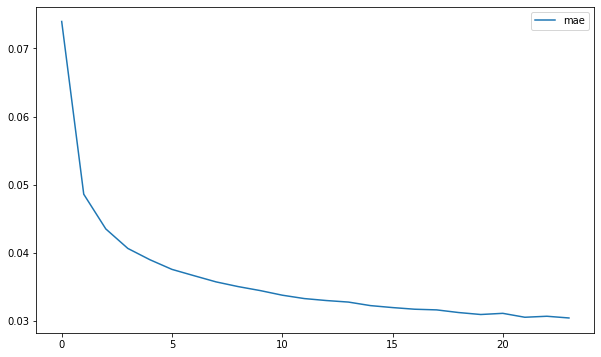

In [74]:

# plot MAE and loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['mae'], label='mae')
#plt.plot(history.history['loss'], label='loss')
plt.legend()
plt.show() 

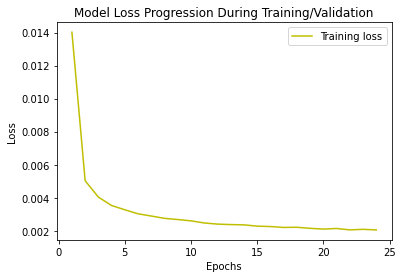

In [75]:
loss= history.history['loss']

epochs=range(1,len(loss)+1)
plt.plot(epochs, loss, 'y', label='Training loss')

plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

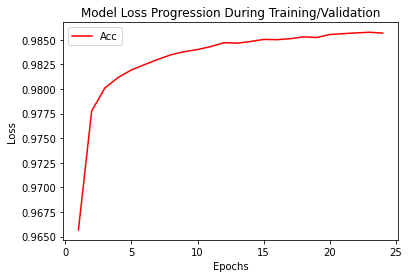

In [76]:

accuracy=history.history['accuracy']
epochs=range(1,len(loss)+1)
plt.plot(epochs,accuracy, 'r', label='Acc')
plt.title('Model Loss Progression During Training/Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [77]:
validation_x[0].shape

(10, 8)

In [78]:
validation_x.shape
test_data = np.reshape(validation_x[0],(1, validation_x[0].shape[0], validation_x[0].shape[1]))

In [79]:
v = X_test[11:]
v.shape

(214887, 8)

In [80]:
test = model.predict(test_data)
test

1/1 [==============================] - 0s 15ms/step


array([[ 0.3514283 , -0.93805915]], dtype=float32)

In [81]:
trainPredict.shape

(644680, 2)

In [82]:
from sklearn.metrics import mean_squared_error

trainScore = np.sqrt(mean_squared_error(train_y, trainPredict))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(validation_y, testPredict))
print('Test Score: %.2f RMSE' % (testScore))

Train Score: 0.04 RMSE
Test Score: 0.05 RMSE


In [83]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


x_test = scaler.inverse_transform(v)

pred = np.zeros((len(testPredict),1))

for iter in range(len(testPredict)):
  x = testPredict[iter][0]
  y = testPredict[iter][1]
  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

  
  if ((pred[iter] >= 80) & (x_test[iter][-1] <= 20)) : 
    pred[iter] = pred[iter] - 100  
    if abs(pred[iter]) >= 5:
      pred[iter] = 0 
  

  if ((pred[iter] <= 20) & (x_test[iter][-1] >= 150)):
    pred[iter] = 100 - pred[iter]
    if abs(pred[iter]) >= 5:
        pred[iter] = 100

  

  

  #if (pred[iter] > 100):
  #  pred[iter] = pred[iter] - 100

pred1=pd.DataFrame(pred).sort_index().reset_index()

In [84]:
#pred = np.zeros((len(testPredict),1))

#for iter in range(len(testPredict)):
#  x = testPredict[iter][0]
#  y = testPredict[iter][1]
#  pred[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


In [85]:
actual = np.zeros((len(validation_y),1))

for iter in range(len(validation_y)):
  x =validation_y[iter][0]
  y =validation_y[iter][1]
  actual[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [86]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual)):
    if (abs(actual[iter] - pred[iter]) <= (i+1)):
      correct+=1

  print(correct)
  print(len(actual))

  print("Precision ", i+1, ": ", correct * 100/len(actual))

157677
214887
Precision  1 :  73.37670496586578
202788
214887
Precision  2 :  94.36959890547125
212229
214887
Precision  3 :  98.7630708232699
214372
214887
Precision  4 :  99.76033915499774
214787
214887
Precision  5 :  99.95346391359179


In [87]:
# linspace
#rv = multivariate_normal ([0,0],[1,.5],[.5,1])
# Z = rv,pdf(pos)
# contour(x,y,z)

In [88]:
perc_rmse = np.sqrt(mean_squared_error(actual, pred))
print("Predicting Percentage RMSE: ", perc_rmse)

Predicting Percentage RMSE:  1.0760620821850408


In [89]:
rmse = 0
length = len(actual)
for i in range(len(actual)):
  if abs (pred[i] - actual[i]) >= 90:
    length -= 1
  else:
    rmse = rmse + pow(pred[i] - actual[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual))
print(rmse)

214887
214887
1.076062082185046


Text(0, 0.5, 'Percentage (%)')

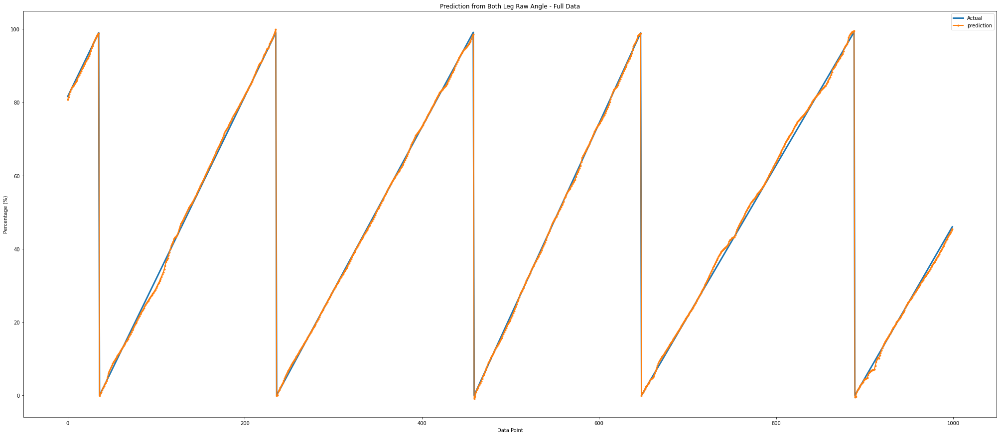

In [90]:
#plt.plot(Y[52272:52470],LShank[52272:52470],'--',label='Actual')
#plt.plot(pred,LShank,'--',label='prediction')
fig=plt.figure(figsize=(35,15))

plt.plot(actual[0:1000],'-',label='Actual', linewidth = 3)
plt.plot(pred[0:1000],'.-',label='prediction', linewidth = 2)



#plt.plot(actual[350:556],Rfoot[350:556],'.',label='Actual')
#plt.plot(pred[350:556],Rfoot[350:556],'.',label='prediction')

plt.legend()
plt.title('Prediction from Both Leg Raw Angle - Full Data')
#plt.title('Right Foot')
#plt.ylabel('Angle')
#plt.xlabel('Gait Cycle Percentage')
plt.xlabel('Data Point')
plt.ylabel('Percentage (%)')

Text(0.5, 1.0, 'Actual vs Prediction')

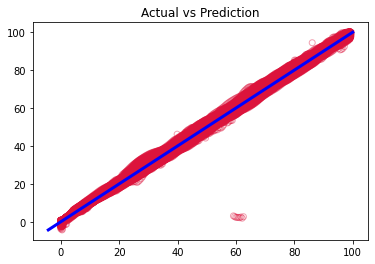

In [91]:
plt.scatter(actual, pred, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(pred), max(actual))
p2 = min(min(pred), min(actual))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

In [92]:
#predict = np.zeros((len(test_new),1))

#for iter in range(len(test_new)):
#  x = test_new[iter][0]
#  y = test_new[iter][1]
#  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


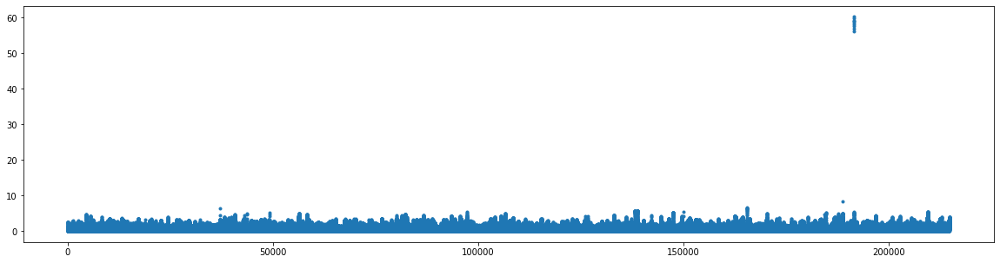

In [93]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual-pred)

plt.plot(dif,'.')


In [94]:
data_dif = pd.DataFrame(pred)
print(data_dif.to_string())

                 0
0        80.704896
1        81.456796
2        82.212377
3        82.979898
4        83.677086
5        84.163953
6        84.465983
7        84.741506
8        85.092744
9        85.514222
10       85.982144
11       86.473178
12       86.971447
13       87.471481
14       87.976282
15       88.492033
16       89.009280
17       89.519979
18       90.012146
19       90.476021
20       90.908823
21       91.318393
22       91.746596
23       92.184208
24       92.690793
25       93.318622
26       94.112516
27       94.897758
28       95.470102
29       96.060438
30       96.719842
31       97.245845
32       97.738219
33       98.152527
34       98.604096
35       98.884446
36       -0.068667
37        0.536705
38        0.798383
39        1.518096
40        2.032085
41        2.542382
42        2.974347
43        3.417879
44        4.034268
45        4.923988
46        6.026980
47        6.543735
48        7.081476
49        7.667910
50        8.206006
51        8.

In [95]:
act_dif = pd.DataFrame(actual)
print(act_dif.to_string())

                0
0       81.592040
1       82.089552
2       82.587065
3       83.084577
4       83.582090
5       84.079602
6       84.577114
7       85.074627
8       85.572139
9       86.069652
10      86.567164
11      87.064677
12      87.562189
13      88.059701
14      88.557214
15      89.054726
16      89.552239
17      90.049751
18      90.547264
19      91.044776
20      91.542289
21      92.039801
22      92.537313
23      93.034826
24      93.532338
25      94.029851
26      94.527363
27      95.024876
28      95.522388
29      96.019900
30      96.517413
31      97.014925
32      97.512438
33      98.009950
34      98.507463
35      99.004975
36       0.000000
37       0.497512
38       0.995025
39       1.492537
40       1.990050
41       2.487562
42       2.985075
43       3.482587
44       3.980100
45       4.477612
46       4.975124
47       5.472637
48       5.970149
49       6.467662
50       6.965174
51       7.462687
52       7.960199
53       8.457711
54       8

In [96]:
for i in range(len(pred)):
    if (abs(actual[i]-pred[i]) > 50):
        print(i)

191593
191594
191595
191596
191597
191598
191599
191600
191601


In [97]:
strike = pd.DataFrame(x_test[:,-1])
print(strike.to_string())

            0
0       165.0
1       166.0
2       167.0
3       168.0
4       169.0
5       170.0
6       171.0
7       172.0
8       173.0
9       174.0
10      175.0
11      176.0
12      177.0
13      178.0
14      179.0
15      180.0
16      181.0
17      182.0
18      183.0
19      184.0
20      185.0
21      186.0
22      187.0
23      188.0
24      189.0
25      190.0
26      191.0
27      192.0
28      193.0
29      194.0
30      195.0
31      196.0
32      197.0
33      198.0
34      199.0
35      200.0
36        1.0
37        2.0
38        3.0
39        4.0
40        5.0
41        6.0
42        7.0
43        8.0
44        9.0
45       10.0
46       11.0
47       12.0
48       13.0
49       14.0
50       15.0
51       16.0
52       17.0
53       18.0
54       19.0
55       20.0
56       21.0
57       22.0
58       23.0
59       24.0
60       25.0
61       26.0
62       27.0
63       28.0
64       29.0
65       30.0
66       31.0
67       32.0
68       33.0
69       34.0
70    

In [98]:
x_test[18604][:]

array([9.45410386e-01, 9.14010749e-01, 3.02046512e-01, 9.77368125e-01,
       6.33203288e-02, 6.01553179e-04, 1.00000000e+00, 1.60000000e+02])

In [99]:
print('Predict: ', pred[18604])
print('Actual: ', actual[18604])

Predict:  [78.79612452]
Actual:  [78.32512315]


In [100]:
dif[18604]

array([0.47100137])

**TEST ON OTHER SUBJECT**

In [101]:
test_file_list = []

for i in range(len(test_sub)):
    test_file_list.append(pd.read_excel(excel_path + test_sub[i], sheet_name='Sheet1'))

In [102]:
## if there are multiple subject to test:
# random.shuffle(test_file_list)

all_test = pd.concat(test_file_list, axis = 0, ignore_index = True)

In [103]:
all_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144475 entries, 0 to 144474
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   l_ph_hip      144475 non-null  float64
 1   l_ph_ank      144475 non-null  float64
 2   l_ph_fo       144475 non-null  float64
 3   r_ph_hip      144475 non-null  float64
 4   r_ph_ank      144475 non-null  float64
 5   r_ph_fo       144475 non-null  float64
 6   n_lgrf        144475 non-null  float64
 7   n_r_grf       144475 non-null  float64
 8   n_lcop        144475 non-null  float64
 9   n_rcop        144475 non-null  float64
 10  perc_new      144475 non-null  float64
 11  st_sw_phase   144475 non-null  int64  
 12  strike_frame  144475 non-null  int64  
dtypes: float64(11), int64(2)
memory usage: 14.3 MB


In [104]:
cycle = 0
cycle_list = []

start = 0

for i in range(len(all_test) - 1):
    if (all_test['perc_new'][i+1] == 0):
        cycle += 1
        cycle_list.append(all_test.iloc[start:i])
        start = i+1

random.shuffle(cycle_list)
test_table = pd.concat(cycle_list, axis=0, ignore_index=True)

test_table

,l_ph_hip,l_ph_ank,l_ph_fo,r_ph_hip,r_ph_ank,r_ph_fo,n_lgrf,n_r_grf,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.547072,0.461697,0.495225,0.874501,0.851008,0.917928,0.871676,0.053363,0.090316,-0.000225,0.000000,0,1
1,0.542278,0.447820,0.494989,0.872767,0.836909,0.910754,0.864708,0.071418,0.090959,-0.000253,0.418410,0,2
2,0.537004,0.433975,0.494766,0.871544,0.825901,0.903304,0.856280,0.091664,0.091537,-0.000281,0.836820,0,3
3,0.531241,0.420438,0.494553,0.870909,0.817131,0.895833,0.846362,0.113629,0.092043,-0.000309,1.255230,0,4
4,0.524984,0.407456,0.494348,0.870922,0.810011,0.888556,0.834918,0.136831,0.092468,-0.000335,1.673640,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
143598,0.577084,0.837783,0.504616,0.856255,0.083708,0.008601,0.870440,0.000000,0.096342,-0.000040,97.540984,0,239
143599,0.574700,0.832284,0.504747,0.855312,0.047684,0.007087,0.870876,0.000000,0.096517,0.000016,97.950820,0,240
143600,0.571957,0.825809,0.504900,0.854572,0.006444,0.003546,0.870386,0.000000,0.096638,0.000086,98.360656,0,241
143601,0.568824,0.818677,0.505071,0.854150,0.964743,0.998104,0.868940,0.000000,0.096703,0.000170,98.770492,0,242


In [105]:
test_table = test_table.drop(drop_list, axis = 1)
test_table

,l_ph_hip,l_ph_fo,r_ph_hip,r_ph_fo,n_lcop,n_rcop,perc_new,st_sw_phase,strike_frame
0,0.547072,0.495225,0.874501,0.917928,0.090316,-0.000225,0.000000,0,1
1,0.542278,0.494989,0.872767,0.910754,0.090959,-0.000253,0.418410,0,2
2,0.537004,0.494766,0.871544,0.903304,0.091537,-0.000281,0.836820,0,3
3,0.531241,0.494553,0.870909,0.895833,0.092043,-0.000309,1.255230,0,4
4,0.524984,0.494348,0.870922,0.888556,0.092468,-0.000335,1.673640,0,5
...,...,...,...,...,...,...,...,...,...
143598,0.577084,0.504616,0.856255,0.008601,0.096342,-0.000040,97.540984,0,239
143599,0.574700,0.504747,0.855312,0.007087,0.096517,0.000016,97.950820,0,240
143600,0.571957,0.504900,0.854572,0.003546,0.096638,0.000086,98.360656,0,241
143601,0.568824,0.505071,0.854150,0.998104,0.096703,0.000170,98.770492,0,242


In [106]:
x_test = test_table
x_test = x_test.drop(['perc_new'], axis=1)
scaler2 = MinMaxScaler()
x_test_scaled = scaler2.fit_transform(x_test)
x_test_scaled = pd.DataFrame(x_test_scaled)

encode_gait_percentage(test_table, 'perc_new')
y_test = source_table[["X","Y"]]
y_test

data_x_test = x_test_scaled


In [107]:
#data_y_test = y_test.values.reshape(-1, 2)
data_y_test = y_test.values

In [108]:
test_x, test_y = convert_data(data_x_test, data_y_test, look_back, fore_cast)

In [109]:
check_point = data_x_test[11:]
check_point.shape

(143592, 8)

In [110]:
crossPredict = model.predict(test_x)

4488/4488 [==============================] - 12s 3ms/step


In [111]:
score = np.sqrt(mean_squared_error(test_y, crossPredict))
print('Test Score: %.3f RMSE' % (score))

Test Score: 0.970 RMSE


In [112]:

check_point_test = scaler2.inverse_transform(check_point)

predict = np.zeros((len(crossPredict),1))

for iter in range(len(crossPredict)):
  x = crossPredict[iter][0]
  y = crossPredict[iter][1]
  predict[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))


  if ((predict[iter] >= 80) & (check_point_test[iter][-1] <= 20)) :
    predict[iter] = predict[iter] - 100
    
    if abs(predict[iter]) >= 5:
        predict[iter] = 0


  if ((predict[iter] <= 20) & (check_point_test[iter][-1] >= 150)):
     predict[iter] = 100 - predict[iter]
     if abs(predict[iter]) >= 5:
         predict[iter] = 100

In [113]:
actual2 = np.zeros((len(test_y),1))

for iter in range(len(test_y)):
  x = test_y[iter][0]
  y = test_y[iter][1]
  actual2[iter] = ((math.atan2(y,x) + 2*math.pi) % (2*math.pi)) * (100 / (2*math.pi))

In [114]:
correct = 0
for i in range(5):
  correct = 0
  for iter in range(len(actual2)):
    #if (abs(actual[iter] - pred[iter]) <= (i+1)) or (actual[iter]>98) or(actual[iter]<3):
      #correct+=1
      if (abs(actual2[iter] - predict[iter]) <= (i+1)):
        correct+=1

  print(correct)
  print(len(actual2))

  print("Precision ", i+1, ": ", correct * 100/len(actual2))

2931
143592
Precision  1 :  2.041200066856092
5866
143592
Precision  2 :  4.085185804223077
8881
143592
Precision  3 :  6.1848849518079
11775
143592
Precision  4 :  8.200317566438242
14574
143592
Precision  5 :  10.1495905064349


In [115]:
perc_rmse_cross = np.sqrt(mean_squared_error(actual2, predict))
print("Predicting Percentage RMSE: ", perc_rmse_cross)

Predicting Percentage RMSE:  41.331172433875274


In [116]:
rmse = 0
length = len(actual2)
for i in range(len(actual2)):

    rmse = rmse + pow(predict[i] - actual2[i], 2)
rmse = rmse / length
rmse = math.sqrt(rmse)
print(length)
print(len(actual2))
print(rmse)

143592
143592
41.33117243387547


Text(0.5, 1.0, 'Actual vs Prediction')

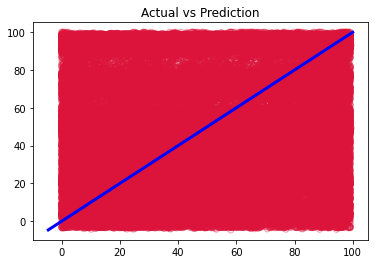

In [117]:
plt.scatter(actual2, predict, facecolors='none', edgecolors='crimson',alpha=0.4)
p1 = max(max(predict), max(actual2))
p2 = min(min(predict), min(actual2))

ci = 0.1 * np.std([p1,p2]) / np.mean([p1,p2])

plt.plot([p1, p2], [p1, p2], 'b-', linewidth =3)
plt.title('Actual vs Prediction')

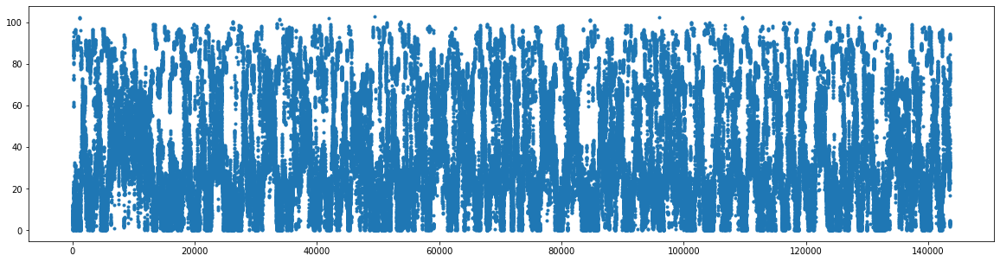

In [118]:
predfig=plt.figure(figsize=(20,5))
dif = abs(actual2-predict)

plt.plot(dif,'.')